In [97]:
from google.colab import drive
drive.mount('/content/drive')

!pwd
%cd /content/drive/MyDrive/ML2023/data-analysis
# !ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/ML2023/data-analysis
/content/drive/MyDrive/ML2023/data-analysis


# **CLASSIFIER**

*This algorithm will identify the optimal classification machine learning model for a given dataset.*

# Import the helper classes

In [98]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import math
from plotly.subplots import make_subplots

from aka_data_analysis.aka_plot import aka_plot, aka_correlation_analysis
from aka_data_analysis.aka_learning import aka_learn,aka_clean,aka_filter

aka_plot = aka_plot()
aka_corr_an = aka_correlation_analysis()
aka_clean = aka_clean()
aka_learn = aka_learn()
aka_filter = aka_filter()
aka_corr_an = aka_correlation_analysis()

In [99]:
# import warnings
# from sklearn.exceptions import FitFailedWarning
# # Filter out the FitFailedWarning
# warnings.filterwarnings("ignore", category=FitFailedWarning)
# warnings.filterwarnings("ignore", category=UserWarning)

In [100]:

import matplotlib.pyplot as plt

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff
import plotly.express as px
import numpy as np
import pandas as pd


# Dataset Information




The data is provided by: https://www.kaggle.com/datasets/ara001/bank-client-attributes-and-marketing-outcomes




The Bank Client Attributes and Marketing Outcomes dataset provides a comprehensive insight into the attributes of bank clients and the outcomes of marketing campaigns. It includes details such as client demographics, employment status, financial history, and contact methods. Additionally, the dataset encompasses the results of marketing campaigns, including the duration, success rates, and previous interactions with clients. This dataset serves as a valuable resource for analyzing customer behavior, optimizing marketing strategies, and enhancing client engagement in the banking sector.


# Import Dataset

In [101]:
df = aka_clean.df_get('Assignment-2_Data.csv/Assignment-2_Data.csv')

# Clean Data

In [102]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Id         45211 non-null  int64  
 1   age        45199 non-null  float64
 2   job        45210 non-null  object 
 3   marital    45211 non-null  object 
 4   education  45211 non-null  object 
 5   default    45211 non-null  object 
 6   balance    45208 non-null  float64
 7   housing    45211 non-null  object 
 8   loan       45211 non-null  object 
 9   contact    45211 non-null  object 
 10  day        45211 non-null  int64  
 11  month      45211 non-null  object 
 12  duration   45211 non-null  int64  
 13  campaign   45211 non-null  int64  
 14  pdays      45211 non-null  int64  
 15  previous   45211 non-null  int64  
 16  poutcome   45211 non-null  object 
 17  y          45211 non-null  object 
dtypes: float64(2), int64(6), object(10)
memory usage: 6.2+ MB


In [103]:
df.head()

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,1001,NaN,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1002,NaN,NaN,single,secondary,no,29.0,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,1003,NaN,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,1004,47.0,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,1005,33.0,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Swap the target and the last feature

In [104]:
df = aka_clean.swap_features(df,-1)
df.head()

Invalid feature indices or feat_a is equal to feat_b.


,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,1001,NaN,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1002,NaN,NaN,single,secondary,no,29.0,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,1003,NaN,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,1004,47.0,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,1005,33.0,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Drop feature(s)


In [105]:
feat = [0,9,10,11,16]
df = aka_clean.drop_feature(df,feat)
df.head()

,age,job,marital,education,default,balance,housing,loan,duration,campaign,pdays,previous,y
0,NaN,management,married,tertiary,no,2143.0,yes,no,261,1,-1,0,no
1,NaN,NaN,single,secondary,no,29.0,yes,no,151,1,-1,0,no
2,NaN,entrepreneur,married,secondary,no,2.0,yes,yes,76,1,-1,0,no
3,47.0,blue-collar,married,unknown,no,1506.0,yes,no,92,1,-1,0,no
4,33.0,unknown,single,unknown,no,1.0,no,no,198,1,-1,0,no


In [106]:
df.describe()

,age,balance,duration,campaign,pdays,previous
count,45199.000000,45208.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.933627,1362.346620,258.163080,2.763841,40.197828,0.580323
std,10.623149,3044.852387,257.527812,3.098021,100.128746,2.303441
min,-1.000000,-8019.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,4918.000000,63.000000,871.000000,275.000000


##  Convert categorical variables into numerical representations

In [107]:
mapping,swapMapping = aka_clean.CleaningVar(df)
df = aka_clean.CleaningDF(df,mapping)
df.head()

,age,job,marital,education,default,balance,housing,loan,duration,campaign,pdays,previous,y
0,32.0,0.0,0,0,0,2143.0,0,0,261,1,-1,0,0
1,32.0,2.0,1,1,0,29.0,0,0,151,1,-1,0,0
2,32.0,1.0,0,1,0,2.0,0,1,76,1,-1,0,0
3,47.0,2.0,0,2,0,1506.0,0,0,92,1,-1,0,0
4,33.0,3.0,1,2,0,1.0,1,0,198,1,-1,0,0


## Balance Dataset

<Axes: ylabel='count'>

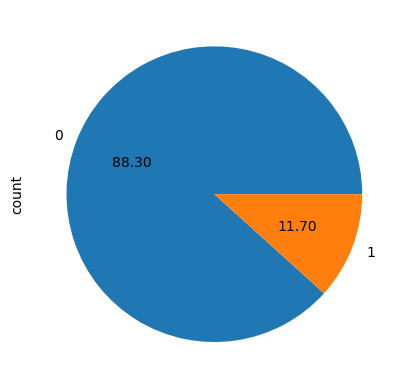

In [108]:
df[df.columns[-1]].value_counts().plot.pie(autopct='%.2f')

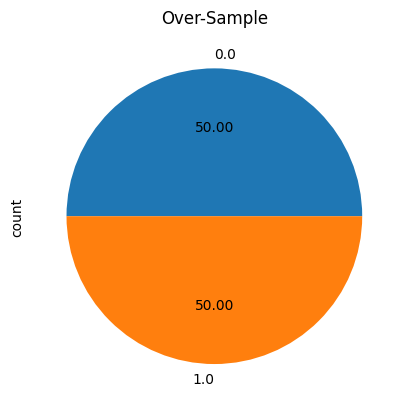

In [109]:
df = aka_clean.balance_df(df,1)

## Clean Dataset

In [110]:

confidence_interval_limit =   3             # Define the limits m of the confidence interval [-m, m] and eliminate the outliers'''

correlation_percentage_threshold = .8      # Set the limit of the correlation between the feature to be removed

df_filtered,corr_tmp = aka_learn.filter_drop_corr_df(df,confidence_interval_limit,correlation_percentage_threshold)

diff_shape = (df.shape[0]-df_filtered.shape[0],df.shape[1]-df_filtered.shape[1])
diff_shape,df_filtered.shape

((35748, 0), (9463, 13))

## Graph the features that are highly correlated


In [111]:
fig = aka_corr_an.Plot_Correlate_Features(df,list(corr_tmp),400,500,3)
if fig is not None:
    fig.show()

Empty list is provided.


## Visualize the distribution of the filtered dataset

In [112]:
aka_plot.Plot_box_Features(df,df_filtered,400,500,3,range(df_filtered.shape[1]))

# Search for the most effective ML algorithm to learn the dataset

## Choose the parameters for the searching

<center>


<font size="45">

**Table of the list of machine learning algorithms to use in the search**

|Keys | ML name |
------ |----------------------
|LGC| Logistic Regression |    
|DTC| Decision Tree Classifier|
|KNN| K-Nearest Neighbors |
|SVC| Support Vector Classification |
|GNB| Gaussian Naive Bayes |
|SGD| Stochastic Gradient Descent |
|ABC| AdaBoost classifier|
|RFC| Random Forest Classifier|
|GBC| Gradient Boosting Classifier|

</font>

</center>

In [113]:

mls = ['DTC','RFC', 'KNN', 'ABC']    # Choose the key of the Machine learning algorithm'GNB',


pre_proc = 'NM'                             # Choose between 'XY' to standardize both 'X' and 'Y',
                                              #                'X' to standardize only 'X',
                                              #                'Y' to standardize only 'Y',
                                              #                'none' to not standardize the dataset
disp_dash = 'all'                             # Choose between  'all' to diplay all report of the ML
                                              #                 'sup'  to display the most significant report

mach = 'adv'                                  # Choose between  'adv' to use advanced parameters in the ML model
                                              #                  'none' to use a default parameters

file_name = 'data'                            # Enter the name of the output data file for the report

file_name_scre = 0.85                        # Enter the minimum value of the ML score to be saved in the report

In [114]:
aka_learn.Search_ML_2(df_filtered ,mls,mach,pre_proc,confidence_interval_limit,correlation_percentage_threshold,diff_shape,disp_dash,file_name,file_name_scre)

conf_inter  corr_per  size_removed  ML   score      MSE    simul_time(min)
___________________________________________________________________________
  3      0.8     (35748, 0)     DTC     77.950     0.221      0.14 
  3      0.8     (35748, 0)     RFC     80.380     0.196      0.61 
  3      0.8     (35748, 0)     KNN     72.666     0.273      0.39 
  3      0.8     (35748, 0)     ABC     80.380     0.196      1.31 


In [115]:
ml = 'RFC'
pre_proc = 'none'

clf,scre,MSE_,y_test,y_pred = aka_learn.ML_pred(df_filtered,pre_proc,ml)



## Confusion Matrix

In [116]:
y_pred_ = aka_clean.swap_map(y_pred,swapMapping)
y_test_ = aka_clean.swap_map(y_test,swapMapping)
Label = [ str(un) for un in np.unique(pd.concat([y_pred_, y_test_]))]

In [117]:
shw = 1
fig2 =  aka_plot.plot_confusion_matrix(y_test_,y_pred_,Label,shw)
fig2.show()

## Classification Report

In [118]:
shw = 1
fig3 =  aka_plot.plot_classification_report(y_test_,y_pred_,Label,shw)
fig3.show()